# Performances des différentes méthodes de segmentation

### 1.Initialisation
Ouverture des images 

In [1]:
import matplotlib.pyplot as plt
import importlib
import numpy as np
import os
import cv2 as cv
import sys 
import pandas as pd

from skimage.io import imread, imshow

dir  = os.getcwd()
dir,__ = os.path.split(dir)
sys.path.append(dir + '/codes')
import fonctions as f

In [4]:
shape_df_realite = pd.read_json(dir + '/data/Ref/Masques/labels_realite_terrain.json')
shape_df_realite = shape_df_realite.transpose().reset_index()[['filename','regions']]
print(len(shape_df_realite), "masques présents")
print(shape_df_realite["filename"][0])

6 masques présents
loriaz1600ouest__2018-12-15__15-00-00(1).JPG


In [10]:
imgs_path = os.listdir(dir + '/data/Ref/Imgs')
imgs_path.sort()
imgs = []
for i in imgs_path:
    imgs.append(imread(f"{dir}/data/Ref/Imgs/{i}"))

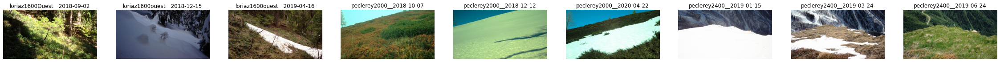

In [11]:
fig, axs = plt.subplots(1, 9, figsize = (40, 10))
for i in range(len(imgs)):
    axs[i].imshow(imgs[i])
    axs[i].set_title(imgs_path[i][:-17])
    axs[i].set_axis_off()
plt.show()

Reconstitution des masques à partir des différents polygones le composant

1 sous masques trouvés
11 sous masques trouvés
1 sous masques trouvés
1 sous masques trouvés
8 sous masques trouvés
16 sous masques trouvés


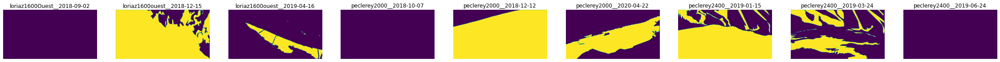

In [12]:
MasquesReels = f.getMasks(imgs, imgs_path, shape_df_realite)
fig, axs = plt.subplots(1, 9, figsize = (40, 10))
for i in range(len(imgs)):
    axs[i].imshow(MasquesReels[i])
    axs[i].set_title(imgs_path[i][:-17])
    axs[i].set_axis_off()
plt.show()

#### Listes d'enregistrement des scores 

In [13]:
methodes, scores = [], []

### 2. Seuillage simple
temps estimé < 10 s

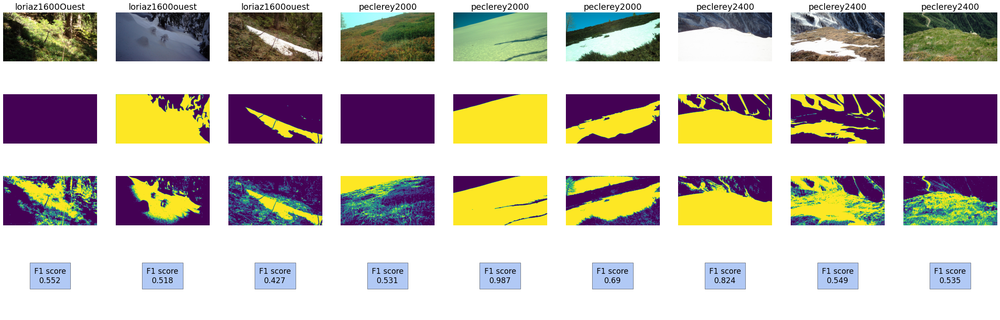

In [9]:
segmented = []

for img in imgs:
    th = f.segmentTreshold(img, 100)
    segmented.append(th)

# évaluation des performances
perf = f.getF1Scores(MasquesReels, segmented)
f.plots(imgs, imgs_path, MasquesReels, segmented, perf)
# f1 score => 1 max (meilleur), => 0 min (pire)
methodes.append("seuillage_simple")
scores.append(perf)

#### Commentaire
La technique de seuillage simple fonctionne mieux sur des zones où la neige se détache clairement de l'image


Cependant il  a de nombreuses fausses alarmes. Amélioration possible : avoir connaissace de présence de neige avant de segmenter


Enfin dette méthode est sensible aux changements d'exposition ce qui rend l'utilisation d'un seuil universel impossible => solution égalisation d'histogramme

### 3. seuillage simple après égalisation d'histogramme
temps estimé < 10 s

/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(


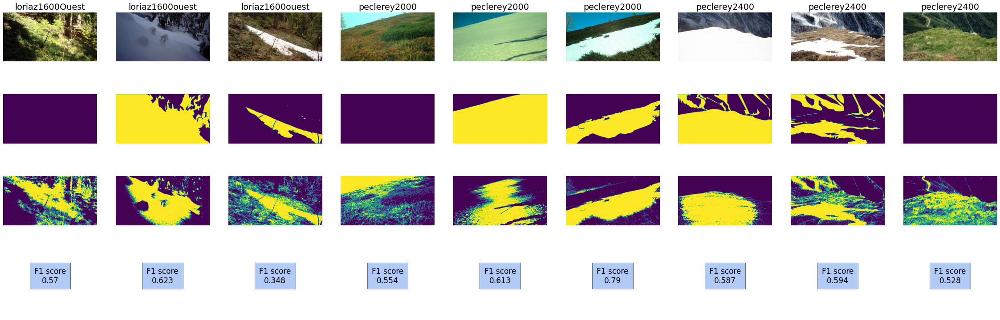

In [10]:
segmented = []

for img in imgs:
    th = f.segmentTreshold(f.equalize(img), 150)
    segmented.append(th)

# évaluation des performances
perf = f.getF1Scores(MasquesReels, segmented)
f.plots(imgs, imgs_path, MasquesReels, segmented, perf)
# f1 score => 1 max (meilleur), => 0 min (pire)
methodes.append("seuillage_simple__hist_eq")
scores.append(perf)

#### Commentaire
Le fait d'égaliser l'histogramme avant de segmenter rend la méthode plus sensible au bruit mais facilite le choix du seuil.

Cependant la robustesse est réduite sur les zones homogènes

### 3. seuillage simple après floutage et égalisation d'histogramme
temps estimé < 10 s

/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(
/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(
/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(


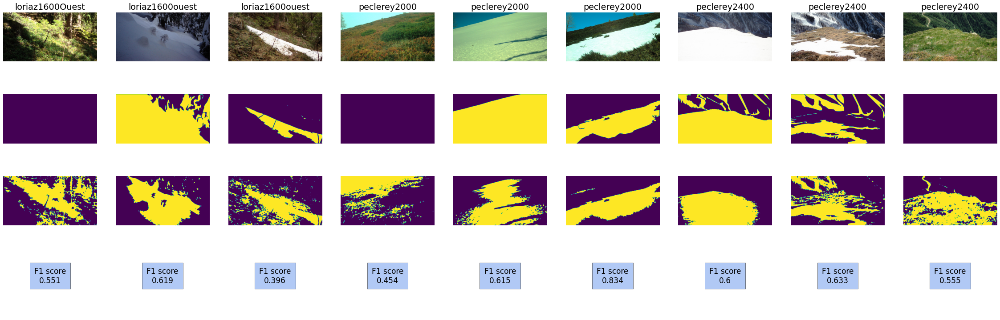

In [11]:
segmented = []

for img in imgs:
    th = f.segmentTreshold(cv.blur(f.equalize(img),(15,15)), 150)
    segmented.append(th)

# évaluation des performances
perf = f.getF1Scores(MasquesReels, segmented)
f.plots(imgs, imgs_path, MasquesReels, segmented, perf)
# f1 score => 1 max (meilleur), => 0 min (pire)
methodes.append("seuillage_simple_hist_eq_blur")
scores.append(perf)

### Seuillage automatique OTSU
temps estimé < 10 s

/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(
/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(
/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(


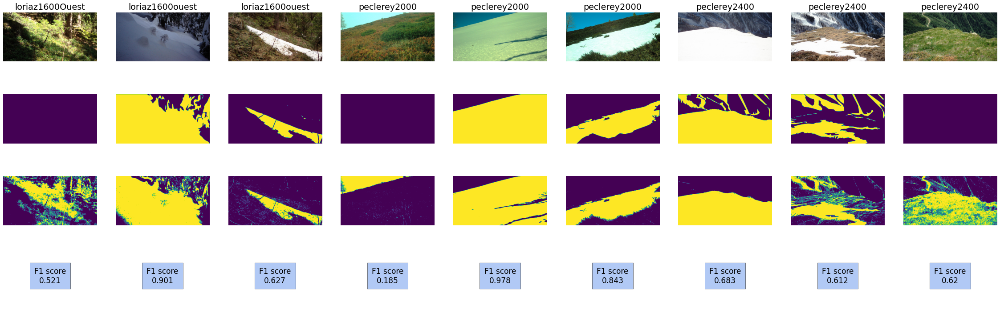

In [12]:
segmented = []

for img in imgs:
    th = f.segmentOTSU(img)
    segmented.append(th)

# évaluation des performances
perf = f.getF1Scores(MasquesReels, segmented)
f.plots(imgs, imgs_path, MasquesReels, segmented, perf)
# f1 score => 1 max (meilleur), => 0 min (pire)
methodes.append("OTSU_RGB")
scores.append(perf)

### Seuillage automatique OTSU sur HSV
temps estimé < 10 s

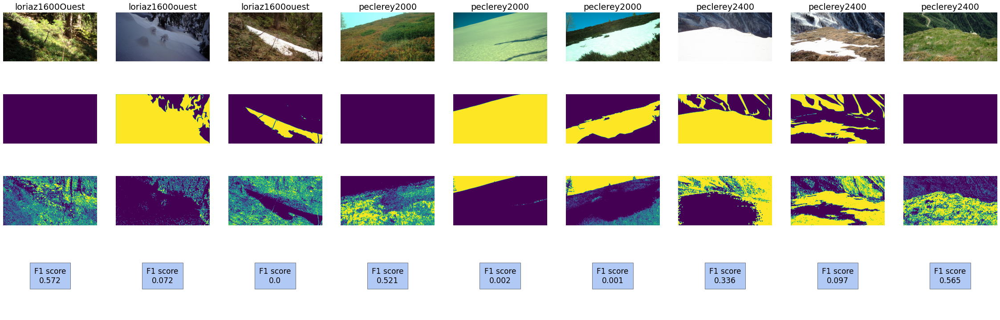

In [13]:
segmented = []

for img in imgs:
    th = f.segmentOTSU(cv.cvtColor(img, cv.COLOR_BGR2HSV))
    segmented.append(th)

# évaluation des performances
perf = f.getF1Scores(MasquesReels, segmented)
f.plots(imgs, imgs_path, MasquesReels, segmented, perf)
# f1 score => 1 max (meilleur), => 0 min (pire)
methodes.append("OTSU_HSV")
scores.append(perf)

#### Commentaire

### 4. seuillage RGB
temps estimé < 2 min


/home/listic/Bureau/Segmentation_neige/exemples_notebooks/fonctionsV2.py:69: RuntimeWarning: overflow encountered in ubyte_scalars
  estUnNiveauDeGris = abs(r-b) > seuilGris or abs(g-b) > seuilGris or abs(g-r) > seuilGris
/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(


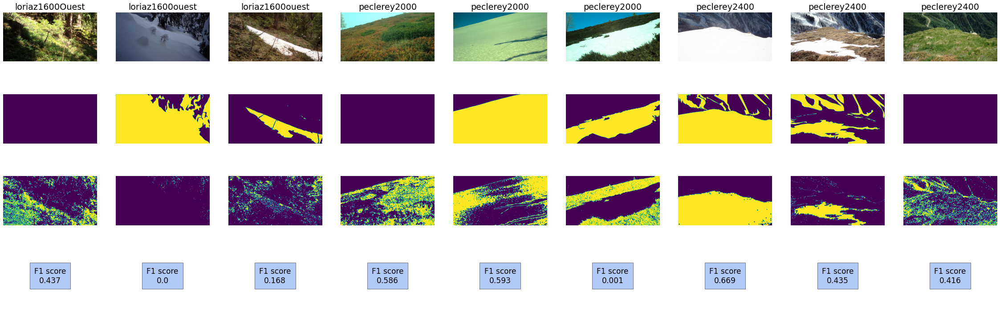

In [14]:
segmented = []

for img in imgs:
    th = f.segmentRGB(img, 5)
    segmented.append(th)

# évaluation des performances
perf = f.getF1Scores(MasquesReels, segmented)
f.plots(imgs, imgs_path, MasquesReels, segmented, perf)
# f1 score => 1 max (meilleur), => 0 min (pire)
methodes.append("seuillage_RBG")
scores.append(perf)

#### Tracé des résultats

#### Commentaire
Le fait de prendre en compte la couleur des pixels lors du seuillage donne de meilleurs résuultats. 

L'inconvnient est le temps de calcul qui a été considérablement augmenté.

### 4. Seuillage RGB après égalisation d'histogramme
temps estimé < 2 min

/home/listic/Bureau/Segmentation_neige/exemples_notebooks/fonctionsV2.py:69: RuntimeWarning: overflow encountered in ubyte_scalars
  estUnNiveauDeGris = abs(r-b) > seuilGris or abs(g-b) > seuilGris or abs(g-r) > seuilGris
/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(


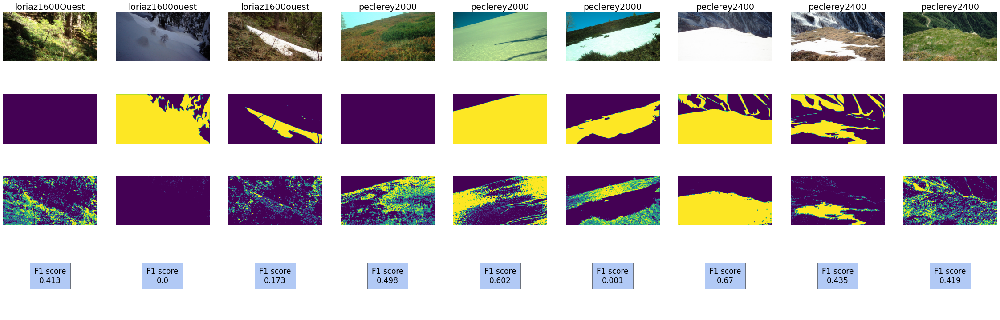

In [15]:
segmented = []

for img in imgs:
    th = th = f.segmentRGB(f.equalize(img), 25)
    segmented.append(th)

# évaluation des performances
perf = f.getF1Scores(MasquesReels, segmented)
f.plots(imgs, imgs_path, MasquesReels, segmented, perf)
# f1 score => 1 max (meilleur), => 0 min (pire)
methodes.append("seuillage_RGB_hist_eq")
scores.append(perf)

#### Tracé des résultats

#### Commentaire
bla bla

### 5. K-means

pour un nombre de classe optimal trouvé égale à 5

2022-07-26 10:28:36.444138: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/listic/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-07-26 10:28:36.444156: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-07-26 10:29:21.311697: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/listic/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2022-07-26 10:29:21.311720: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-07-26 10:29:21.311735: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel d

/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(
/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(
/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(
/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with

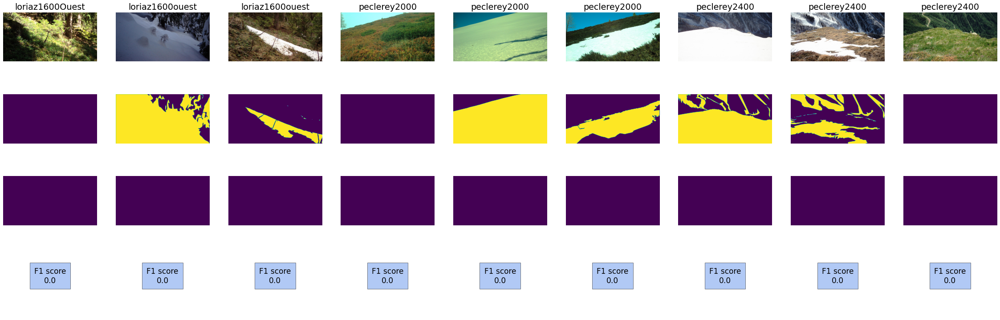

In [14]:
importlib.reload(f)
segmented = []

for img in imgs:
    th = f.segmentkMeans(img, 5, dir)
    segmented.append(th)

# évaluation des performances
perf = f.getF1Scores(MasquesReels, segmented)
f.plots(imgs, imgs_path, MasquesReels, segmented, perf)
# f1 score => 1 max (meilleur), => 0 min (pire)
methodes.append("k-means")
scores.append(perf)

### 6. segmentation dans l'espace 3d

/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(


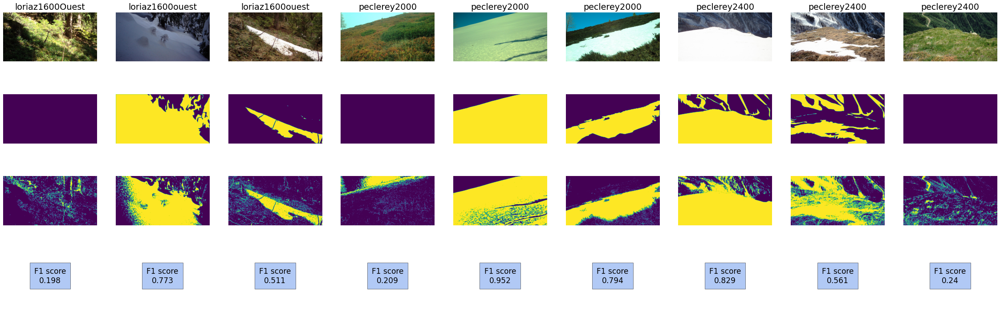

In [ ]:
segmented = [f.segmentSpace(img) for img in imgs]

# évaluation des performances
perf = f.getF1Scores(MasquesReels, segmented)
f.plots(imgs, imgs_path, MasquesReels, segmented, perf)
# f1 score => 1 max (meilleur), => 0 min (pire)
methodes.append("3d_range")
scores.append(perf)

### Segmentation par patch (classification SVM)

nb img for trainning = 3325.0
nb img for trainning = 3325.0
nb img for trainning = 3325.0
nb img for trainning = 3325.0
nb img for trainning = 3325.0
nb img for trainning = 3325.0
nb img for trainning = 3325.0
nb img for trainning = 3325.0
nb img for trainning = 3325.0


/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(


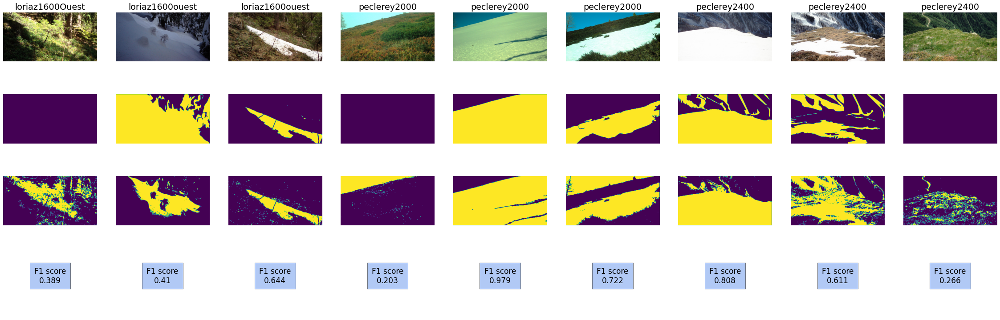

In [ ]:
segmented = []
for img in imgs:
    # hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
    th = f.segmentedSVM(img, dir, patchSize = 5)
    segmented.append(th)

# évaluation des performances
perf = f.getF1Scores(MasquesReels, segmented)
f.plots(imgs, imgs_path, MasquesReels, segmented, perf)
# f1 score => 1 max (meilleur), => 0 min (pire)
methodes.append("SVM")
scores.append(perf)

## 8. Segmentation U-net

-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


/home/listic/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1495: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(


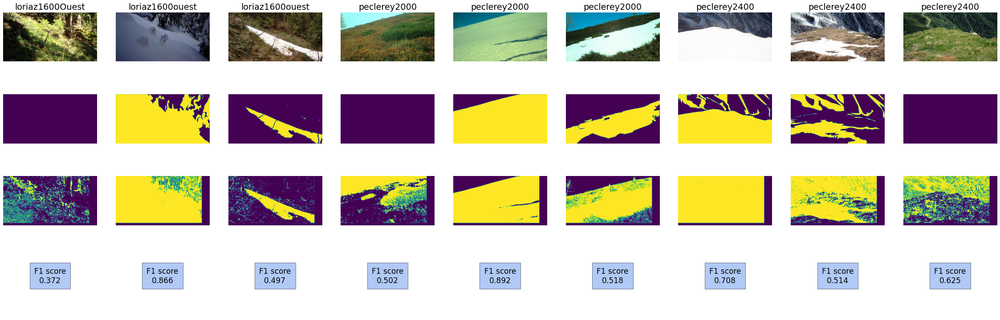

In [ ]:
segmented = []

for img in imgs:
    # hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
    th = f.segmentedUnet(img, mod_filename=f"{dir}/Modèles_trained/Segmentation_Unet/20ep_200step_V8.h5")
    segmented.append(th)

# évaluation des performances
perf = f.getF1Scores(MasquesReels, segmented)
f.plots(imgs, imgs_path, MasquesReels, segmented, perf)
# f1 score => 1 max (meilleur), => 0 min (pire)
methodes.append("U-net")
scores.append(perf)

## Analyse de scores F1

,seuillage_simple,seuillage_simple__hist_eq,seuillage_simple_hist_eq_blur,OTSU_RGB,OTSU_HSV,seuillage_RBG,seuillage_RGB_hist_eq,k-means,3d_range,SVM,U-net
loriaz1600Ouest__2018-09-02,0.552,0.570,0.551,0.521,0.572,0.437,0.413,0.0,0.198,0.389,0.372
loriaz1600ouest__2018-12-15,0.518,0.623,0.619,0.901,0.072,0.000,0.000,0.0,0.773,0.410,0.866
loriaz1600ouest__2019-04-16,0.427,0.348,0.396,0.627,0.000,0.168,0.173,0.0,0.511,0.644,0.497
peclerey2000__2018-10-07,0.531,0.554,0.454,0.185,0.521,0.586,0.498,0.0,0.209,0.203,0.502
peclerey2000__2018-12-12,0.987,0.613,0.615,0.978,0.002,0.593,0.602,0.0,0.952,0.979,0.892
peclerey2000__2020-04-22,0.690,0.790,0.834,0.843,0.001,0.001,0.001,0.0,0.794,0.722,0.518
peclerey2400__2019-01-15,0.824,0.587,0.600,0.683,0.336,0.669,0.670,0.0,0.829,0.808,0.708
peclerey2400__2019-03-24,0.549,0.594,0.633,0.612,0.097,0.435,0.435,0.0,0.561,0.611,0.514
peclerey2400__2019-06-24,0.535,0.528,0.555,0.620,0.565,0.416,0.419,0.0,0.240,0.266,0.625


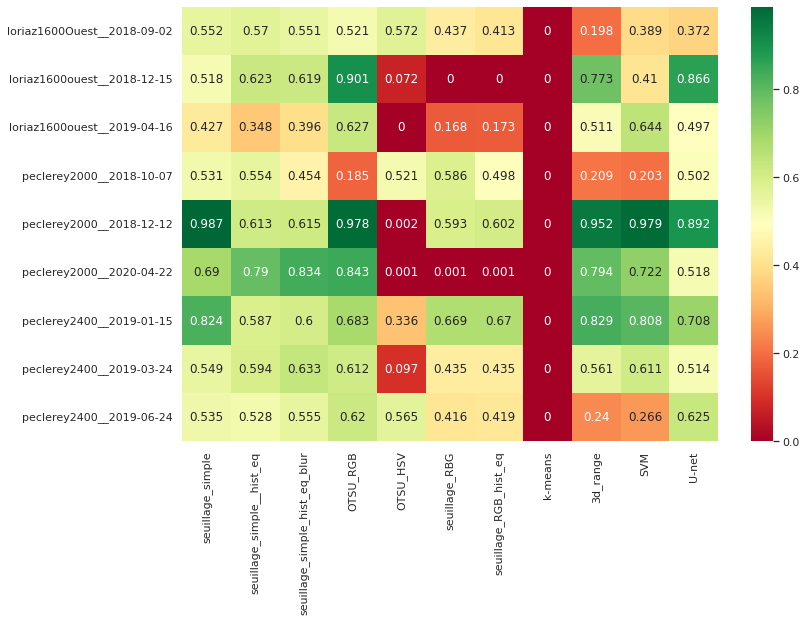

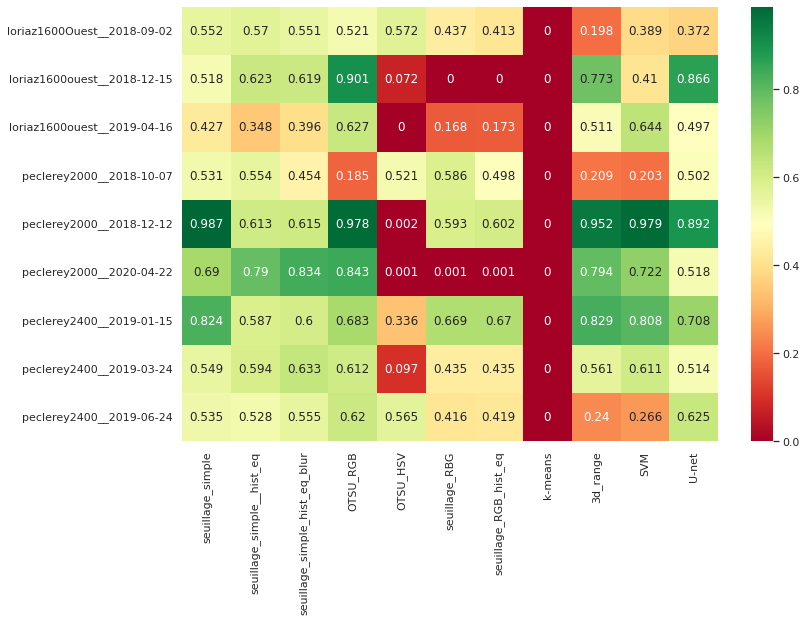

In [ ]:
# format du dictionnaire
# f1scores = {
#     methode1 : {zone1 : scores
#                 zone2 : scores
#                 zone3 : scores
#     }
#     methode2 : {zone1 : scores
#                 zone2 : scores
#                 zone3 : scores
#     }
# }

f1scores = {}
for met, perf in zip(methodes, scores):
    f1scores[met] = {}
    i=0
    for zone in imgs_path:
        f1scores[met][zone[:-17]] = round(perf[i], 3)
        i+=1

import pandas as pd
import seaborn as sns
sns.set(rc={"figure.figsize":(12,8)})

df = pd.DataFrame(f1scores)
display(df)
g = sns.heatmap(df, cmap="RdYlGn", annot=True, fmt="g")
g.get_figure()

In [ ]:
# l = []
# sum([e['score'] for e in l if e['nom-image' in ['img1', 'img2']]])

# Tracé de l'évolotion temporelle de l'enneigement sur la zone Peclerey 2000 et sur l'année 2019

In [ ]:
import matplotlib.dates as mdates

def getRatio(masque):
    """
    image: image original
    kPixelNeige: nombre de pixels trouvés suite à la segmentation

    return ratio: pourcentage de neige présene dans l'image
    """
    return 100*np.count_nonzero(masque*1)/(len(masque[0])*len(masque))

path = os.chdir(dir + '/data/Serie_temporelle_Peclerey_2019')


imgs_path = os.listdir()
imgs_path.sort()


serie = []
for i in imgs_path:
    serie.append(imread(i))
    
truthRatios, estimatedRatios = [], []
for img in serie:
    th = f.segmentSpace(img)
    estimatedRatios.append(getRatio(th))


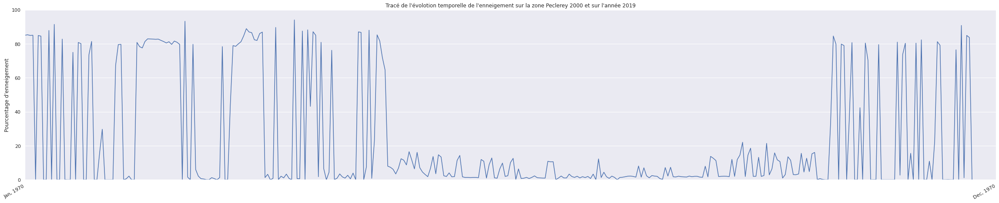

In [ ]:
month_year_formatter = mdates.DateFormatter('%b, %Y') # The "," is intentional.
half_year_locator = mdates.MonthLocator(interval=30)
monthly_locator = mdates.MonthLocator()

fig, ax = plt.subplots(figsize=(40, 8))
ax.set_ylabel("Pourcentage d'enneigement")
ax.set_ylim(0, 100)
ax.set_xlim(0, 364)
ax.set_title("Tracé de l'évolotion temporelle de l'enneigement sur la zone Peclerey 2000 et sur l'année 2019")
plt.rcParams.update({'font.size': 22})

ax.xaxis.set_major_locator(half_year_locator)
ax.xaxis.set_minor_locator(monthly_locator)
ax.xaxis.set_major_formatter(month_year_formatter)
ax.plot(imgs_path, estimatedRatios)

fig.autofmt_xdate()
plt.show()

## Ajoutd'une moyenne mobile

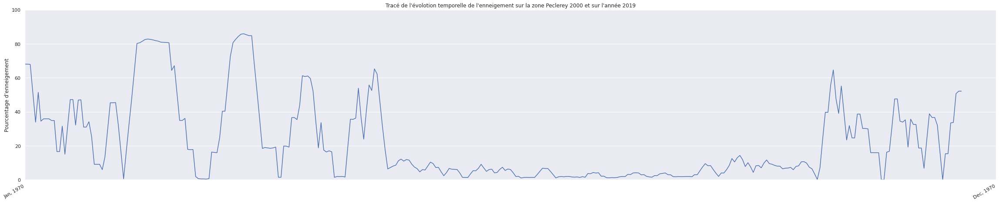

In [ ]:
# moyenne temporelle pour atténuer les abérations
def moving_average(x, w=10):
    return np.convolve(x, np.ones(w), 'valid') / w

estimatedRatiosMoy = moving_average(estimatedRatios, 5)

month_year_formatter = mdates.DateFormatter('%b, %Y') # The "," is intentional.
half_year_locator = mdates.MonthLocator(interval=30)
monthly_locator = mdates.MonthLocator()

plt.rcParams.update({'font.size': 22})
fig, ax = plt.subplots(figsize=(40, 8))
ax.set_ylabel("Pourcentage d'enneigement")
ax.set_ylim(0, 100)
ax.set_xlim(0, 364)
ax.set_title("Tracé de l'évolotion temporelle de l'enneigement sur la zone Peclerey 2000 et sur l'année 2019")

ax.xaxis.set_major_locator(half_year_locator)
ax.xaxis.set_minor_locator(monthly_locator)
ax.xaxis.set_major_formatter(month_year_formatter)
ax.plot(imgs_path[:len(estimatedRatiosMoy)], estimatedRatiosMoy)

fig.autofmt_xdate()
plt.show()

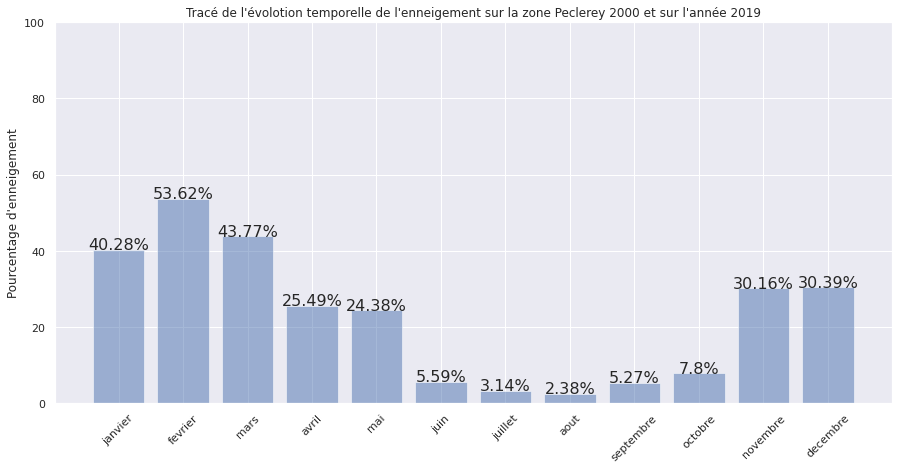

In [ ]:

dates = ["janvier", "fevrier", "mars", "avril", "mai", "juin", "juillet", "aout", "septembre", "octobre", "novembre", "decembre"]
ratios = [np.mean(estimatedRatios[i:i+30]) for i in range(0, len(estimatedRatios), 30)]
y_pos = np.arange(len(dates))

plt.rcParams.update({'font.size': 16})
plt.figure(figsize = (15, 7))
pps = plt.bar(y_pos, ratios, align='center', alpha=0.5)
for p in pps:
    height = p.get_height()
    height = round(height, 2)
    plt.text(x=p.get_x() + p.get_width() / 2, y=height+.10, s="{}%".format(height), ha='center')

plt.xticks(y_pos, dates)
plt.xticks(rotation = 45)
plt.ylabel("Pourcentage d'enneigement")
plt.ylim(0, 100)
plt.title("Tracé de l'évolotion temporelle de l'enneigement sur la zone Peclerey 2000 et sur l'année 2019")

plt.show()